In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd
import pickle
import csv

from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from PIL import Image

import os
print(os.listdir("drive/MyDrive/Colab Notebooks/archive (10)"))

['anno_train.csv', 'anno_test.csv', 'names.csv', 'car_data']


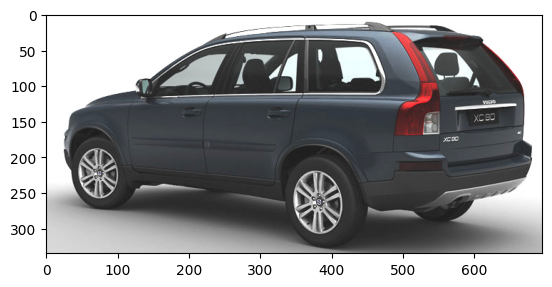

In [9]:
path_base = 'drive/MyDrive/Colab Notebooks/archive (10)/car_data/car_data'

image = Image.open(path_base + '/train/Volvo XC90 SUV 2007/00954.jpg')
imgplot = plt.imshow(image)
plt.show()

In [11]:
class_names = []

with open( 'drive/MyDrive/Colab Notebooks/archive (10)' + '/names.csv') as csvDataFile:
    csvReader = csv.reader(csvDataFile, delimiter=';')
    for row in csvReader:
        class_names.append(row[0])

print(class_names)

['AM General Hummer SUV 2000', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008', 'Acura TSX Sedan 2012', 'Acura Integra Type R 2001', 'Acura ZDX Hatchback 2012', 'Aston Martin V8 Vantage Convertible 2012', 'Aston Martin V8 Vantage Coupe 2012', 'Aston Martin Virage Convertible 2012', 'Aston Martin Virage Coupe 2012', 'Audi RS 4 Convertible 2008', 'Audi A5 Coupe 2012', 'Audi TTS Coupe 2012', 'Audi R8 Coupe 2012', 'Audi V8 Sedan 1994', 'Audi 100 Sedan 1994', 'Audi 100 Wagon 1994', 'Audi TT Hatchback 2011', 'Audi S6 Sedan 2011', 'Audi S5 Convertible 2012', 'Audi S5 Coupe 2012', 'Audi S4 Sedan 2012', 'Audi S4 Sedan 2007', 'Audi TT RS Coupe 2012', 'BMW ActiveHybrid 5 Sedan 2012', 'BMW 1 Series Convertible 2012', 'BMW 1 Series Coupe 2012', 'BMW 3 Series Sedan 2012', 'BMW 3 Series Wagon 2012', 'BMW 6 Series Convertible 2007', 'BMW X5 SUV 2007', 'BMW X6 SUV 2012', 'BMW M3 Coupe 2012', 'BMW M5 Sedan 2010', 'BMW M6 Convertible 2010', 'BMW X3 SUV 2012', 'BMW Z4 Convertible 2012

In [12]:
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import densenet
from keras.models import Sequential, Model, load_model
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, Callback
from keras import regularizers
from keras import backend as K

In [13]:
K.set_learning_phase(1)

/usr/local/lib/python3.10/dist-packages/keras/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


In [14]:
img_width, img_height = 224, 224
nb_train_samples = 8144
nb_validation_samples = 8041
epochs = 10
batch_size = 32
n_classes = 196

In [16]:
train_data_dir = path_base + '/train'
validation_data_dir = path_base + '/test'

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    #shear_range=0.2,
    zoom_range=0.2,
    #fill_mode = 'constant',
    #cval = 1,
    rotation_range = 5,
    #width_shift_range=0.2,
    #height_shift_range=0.2,
    horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [19]:
def build_model():
    base_model = densenet.DenseNet121(input_shape=(img_width, img_height, 3),
                                     weights=None,
                                     include_top=False,
                                     pooling='avg')
    for layer in base_model.layers:
      layer.trainable = True

    x = base_model.output
    x = Dense(1000, kernel_regularizer=regularizers.l1_l2(0.01), activity_regularizer=regularizers.l2(0.01))(x)
    x = Activation('relu')(x)
    x = Dense(500, kernel_regularizer=regularizers.l1_l2(0.01), activity_regularizer=regularizers.l2(0.01))(x)
    x = Activation('relu')(x)
    predictions = Dense(n_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    
    return model

In [20]:
model = build_model()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc', 'mse'])

In [21]:
early_stop = EarlyStopping(monitor='val_loss', patience=8, verbose=1, min_delta=1e-4)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, verbose=1, min_delta=1e-4)
callbacks_list = [early_stop, reduce_lr]

In [22]:
model_history = model.fit_generator(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size,
    callbacks=callbacks_list)

<ipython-input-22-549e635851e6>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model_history = model.fit_generator(


Epoch 1/10
255/255 [==============================] - 5135s 20s/step - loss: 44.2561 - acc: 0.0070 - mse: 0.0051 - val_loss: 7.0375 - val_acc: 0.0085 - val_mse: 0.0051 - lr: 0.0010
Epoch 2/10
255/255 [==============================] - 301s 1s/step - loss: 7.0189 - acc: 0.0083 - mse: 0.0051 - val_loss: 7.0015 - val_acc: 0.0085 - val_mse: 0.0051 - lr: 0.0010
Epoch 3/10
255/255 [==============================] - 289s 1s/step - loss: 6.9907 - acc: 0.0083 - mse: 0.0051 - val_loss: 6.9757 - val_acc: 0.0083 - val_mse: 0.0051 - lr: 0.0010
Epoch 4/10
255/255 [==============================] - 338s 1s/step - loss: 6.9702 - acc: 0.0083 - mse: 0.0051 - val_loss: 6.9636 - val_acc: 0.0085 - val_mse: 0.0051 - lr: 0.0010
Epoch 5/10
255/255 [==============================] - 283s 1s/step - loss: 6.9661 - acc: 0.0083 - mse: 0.0051 - val_loss: 6.9682 - val_acc: 0.0085 - val_mse: 0.0051 - lr: 0.0010
Epoch 6/10
255/255 [==============================] - 281s 1s/step - loss: 6.9742 - acc: 0.0083 - mse: 0.00

KeyError: ignored

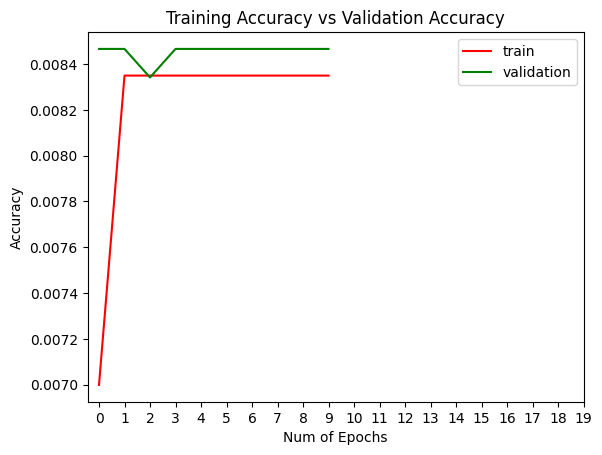

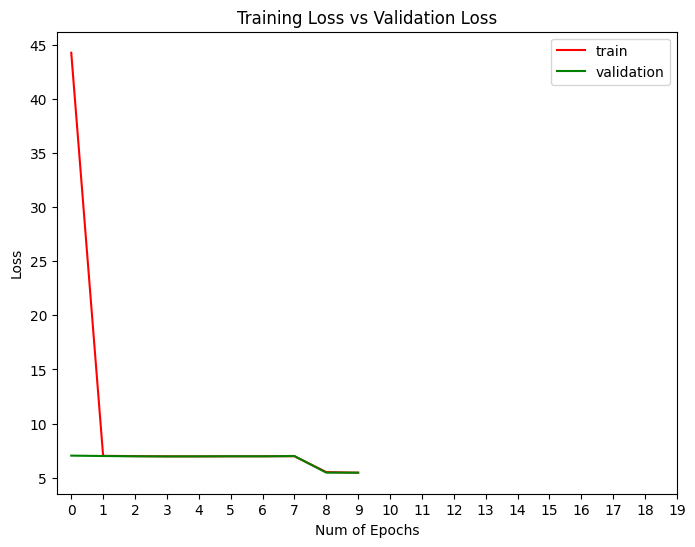

<Figure size 800x600 with 0 Axes>

In [23]:
plt.figure(0)
plt.plot(model_history.history['acc'],'r')
plt.plot(model_history.history['val_acc'],'g')
plt.xticks(np.arange(0, 20, 1.0))
plt.rcParams['figure.figsize'] = (8, 6)
plt.xlabel("Num of Epochs")
plt.ylabel("Accuracy")
plt.title("Training Accuracy vs Validation Accuracy")
plt.legend(['train','validation'])
 
plt.figure(1)
plt.plot(model_history.history['loss'],'r')
plt.plot(model_history.history['val_loss'],'g')
plt.xticks(np.arange(0, 20, 1.0))
plt.rcParams['figure.figsize'] = (8, 6)
plt.xlabel("Num of Epochs")
plt.ylabel("Loss")
plt.title("Training Loss vs Validation Loss")
plt.legend(['train','validation'])

plt.figure(2)
plt.plot(model_history.history['mean_squared_error'],'r')
plt.plot(model_history.history['val_mean_squared_error'],'g')
plt.xticks(np.arange(0, 20, 1.0))
plt.rcParams['figure.figsize'] = (8, 6)
plt.xlabel("Num of Epochs")
plt.ylabel("MSE")
plt.title("Training Loss vs Validation Loss")
plt.legend(['train','validation'])
 
plt.show()

In [29]:
model.save("model6.h5")

In [24]:
model.evaluate_generator(validation_generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False)

<ipython-input-24-6fa56aa48dba>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  model.evaluate_generator(validation_generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False)


[5.464441299438477, 0.008456659503281116, 0.005075744818896055]

In [25]:
pred = model.predict_generator(validation_generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False, verbose=1)
predicted = np.argmax(pred, axis=1)

<ipython-input-25-1dcc62e736b0>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred = model.predict_generator(validation_generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False, verbose=1)


252/252 [==============================] - 94s 367ms/step


Confusion Matrix


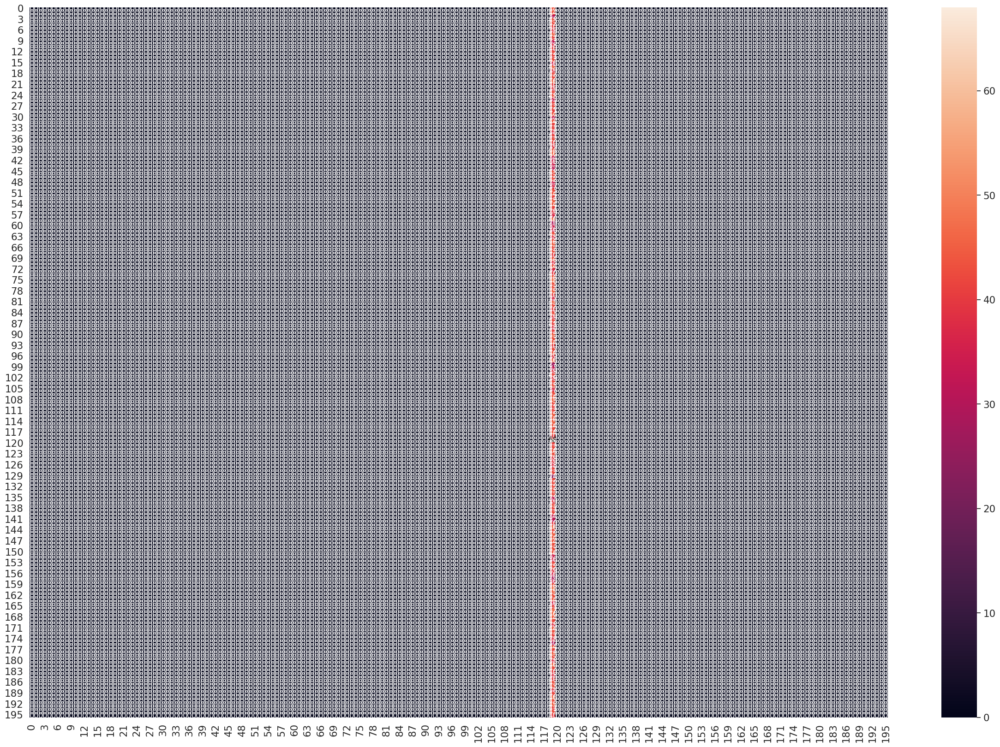


Classification Report
                                                        precision    recall  f1-score   support

                            AM General Hummer SUV 2000       0.00      0.00      0.00        44
                                   Acura RL Sedan 2012       0.00      0.00      0.00        44
                                   Acura TL Sedan 2012       0.00      0.00      0.00        32
                                  Acura TL Type-S 2008       0.00      0.00      0.00        43
                                  Acura TSX Sedan 2012       0.00      0.00      0.00        42
                             Acura Integra Type R 2001       0.00      0.00      0.00        40
                              Acura ZDX Hatchback 2012       0.00      0.00      0.00        39
              Aston Martin V8 Vantage Convertible 2012       0.00      0.00      0.00        45
                    Aston Martin V8 Vantage Coupe 2012       0.00      0.00      0.00        41
                

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [26]:
print('Confusion Matrix')
cm = confusion_matrix(validation_generator.classes, np.argmax(pred, axis=1))
plt.figure(figsize = (30,20))
sn.set(font_scale=1.4) #for label size
sn.heatmap(cm, annot=True, annot_kws={"size": 12}) # font size
plt.show()
print()
print('Classification Report')
print(classification_report(validation_generator.classes, predicted, target_names=class_names))

1/1 [==============================] - 0s 107ms/step


<ipython-input-28-5dc061b4a1fc>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(k)


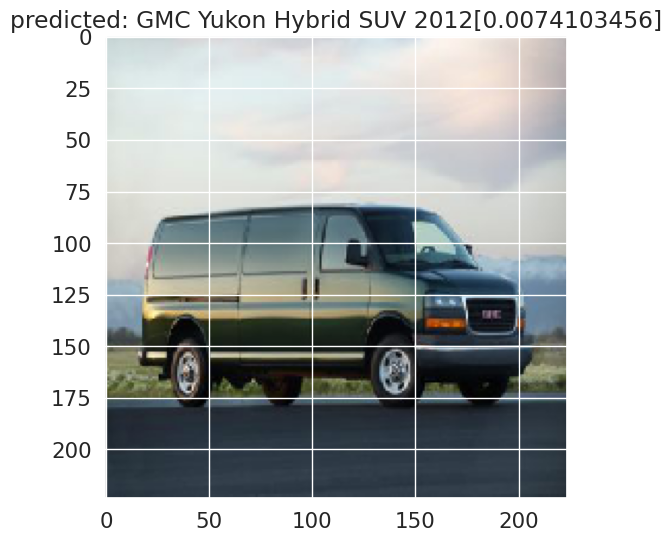

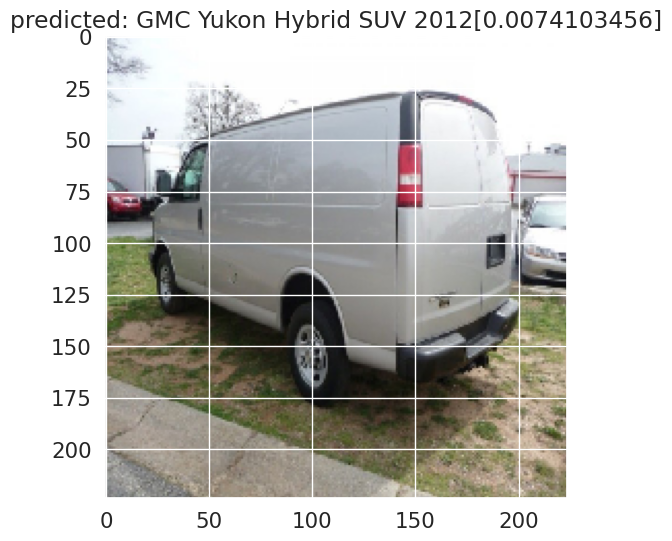

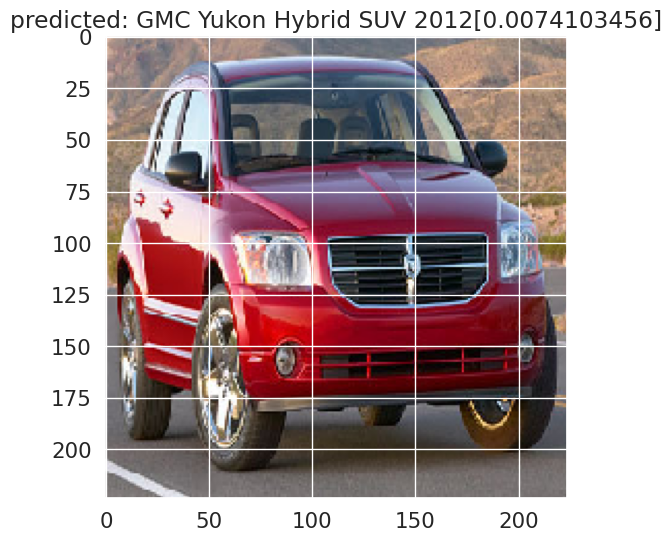

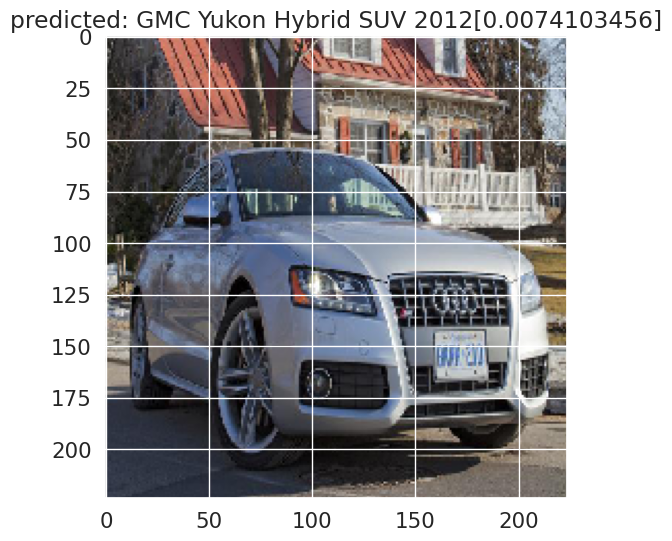

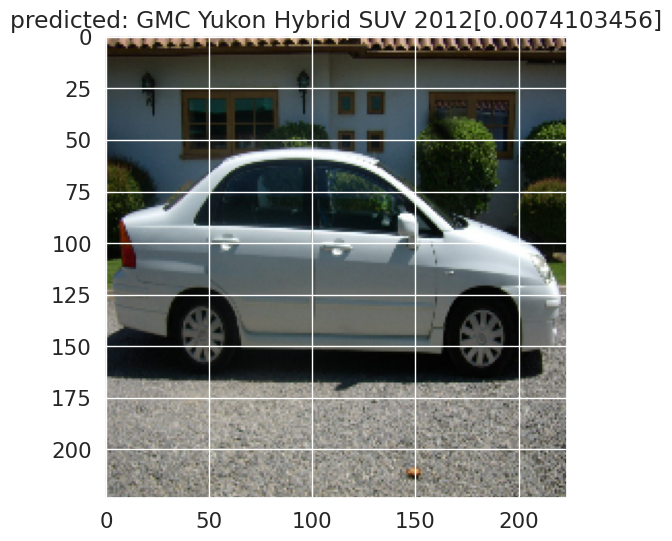

...

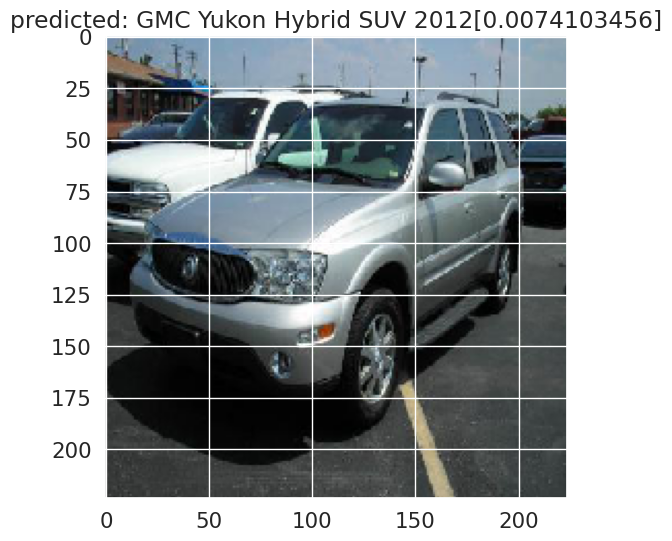

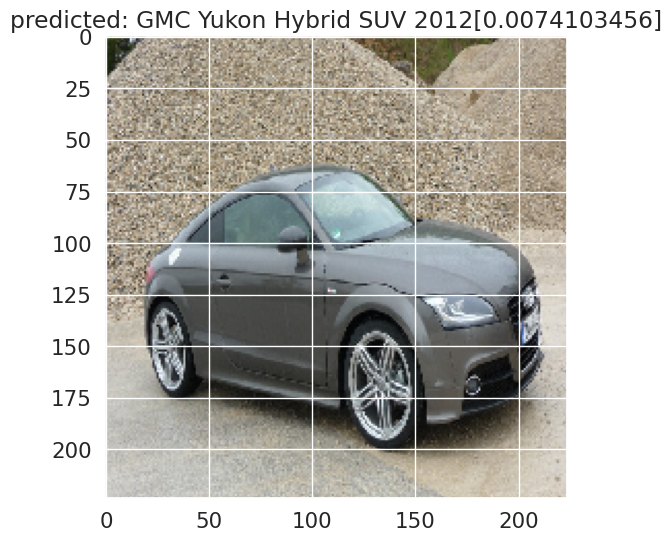

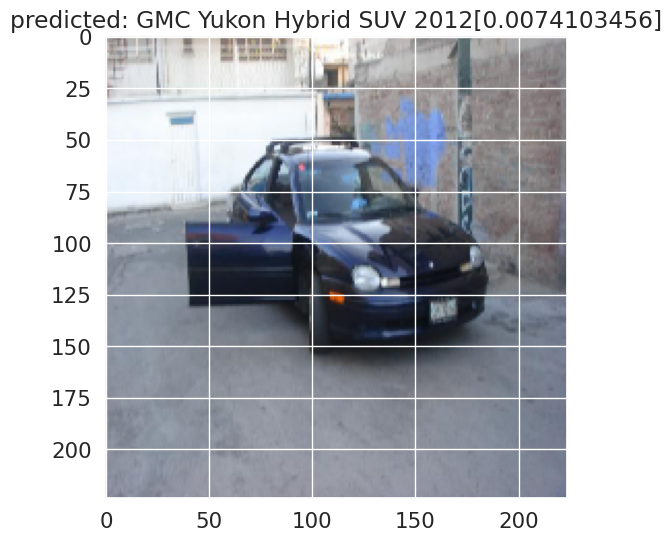

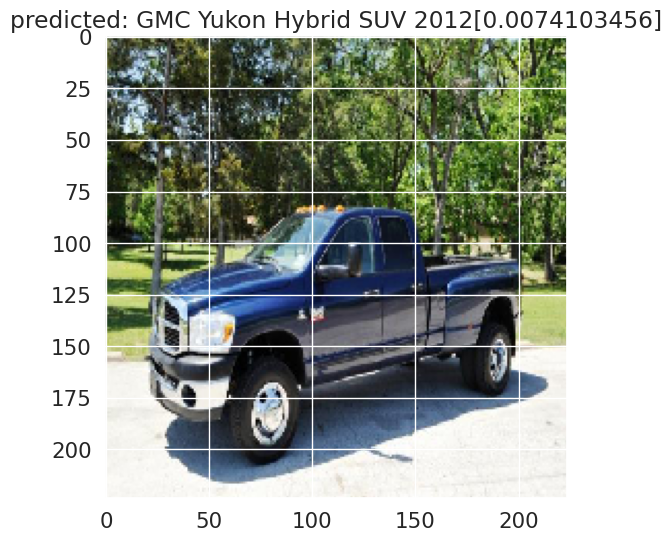

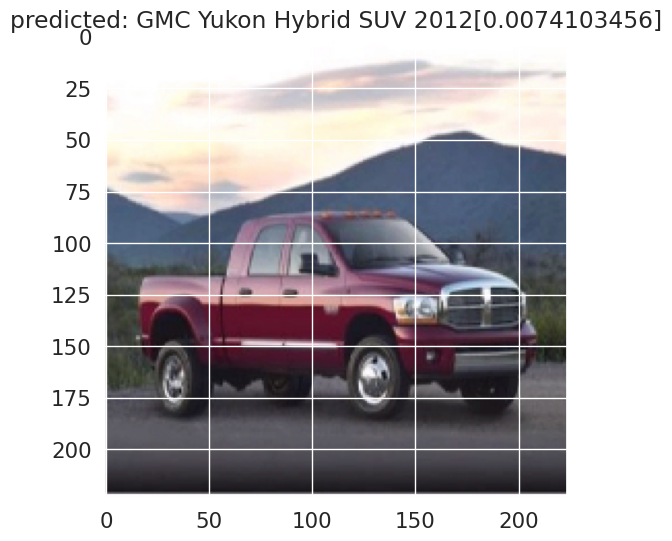

In [28]:
def predict_one(model):
    image_batch, classes_batch = next(validation_generator)
    predicted_batch = model.predict(image_batch)
    for k in range(0,image_batch.shape[0]):
      image = image_batch[k]
      pred = predicted_batch[k]
      the_pred = np.argmax(pred)
      predicted = class_names[the_pred]
      val_pred = max(pred)
      the_class = np.argmax(classes_batch[k])
      value = class_names[np.argmax(classes_batch[k])]
      plt.figure(k)
      isTrue = (the_pred == the_class)
      plt.title( 'predicted: ' + predicted + '[' + str(val_pred) + ']')
      plt.imshow(image)

predict_one(model)

In [30]:
from tensorflow.keras.preprocessing import image
import numpy as np

In [32]:
## Testing 1

img= image.load_img('/content/drive/MyDrive/Colab Notebooks/archive (10)/car_data/car_data/test/GMC Yukon Hybrid SUV 2012/00056.jpg',target_size=(192,192))   #read image
X= image.img_to_array(img)  # converting the image into array

X= np.expand_dims(X,axis=0)
pred = np.argmax(model.predict(X)) # predicting the higher probability index
op=['AM General Hummer SUV 2000', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008', 'Acura TSX Sedan 2012', 'Acura Integra Type R 2001', 'Acura ZDX Hatchback 2012', 'Aston Martin V8 Vantage Convertible 2012', 'Aston Martin V8 Vantage Coupe 2012', 'Aston Martin Virage Convertible 2012', 'Aston Martin Virage Coupe 2012', 'Audi RS 4 Convertible 2008', 'Audi A5 Coupe 2012', 'Audi TTS Coupe 2012', 'Audi R8 Coupe 2012', 'Audi V8 Sedan 1994', 'Audi 100 Sedan 1994', 'Audi 100 Wagon 1994', 'Audi TT Hatchback 2011', 'Audi S6 Sedan 2011', 'Audi S5 Convertible 2012', 'Audi S5 Coupe 2012', 'Audi S4 Sedan 2012', 'Audi S4 Sedan 2007', 'Audi TT RS Coupe 2012', 'BMW ActiveHybrid 5 Sedan 2012', 'BMW 1 Series Convertible 2012', 'BMW 1 Series Coupe 2012', 'BMW 3 Series Sedan 2012', 'BMW 3 Series Wagon 2012', 'BMW 6 Series Convertible 2007', 'BMW X5 SUV 2007', 'BMW X6 SUV 2012', 'BMW M3 Coupe 2012', 'BMW M5 Sedan 2010', 'BMW M6 Convertible 2010', 'BMW X3 SUV 2012', 'BMW Z4 Convertible 2012', 'Bentley Continental Supersports Conv. Convertible 2012', 'Bentley Arnage Sedan 2009', 'Bentley Mulsanne Sedan 2011', 'Bentley Continental GT Coupe 2012', 'Bentley Continental GT Coupe 2007', 'Bentley Continental Flying Spur Sedan 2007', 'Bugatti Veyron 16.4 Convertible 2009', 'Bugatti Veyron 16.4 Coupe 2009', 'Buick Regal GS 2012', 'Buick Rainier SUV 2007', 'Buick Verano Sedan 2012', 'Buick Enclave SUV 2012', 'Cadillac CTS-V Sedan 2012', 'Cadillac SRX SUV 2012', 'Cadillac Escalade EXT Crew Cab 2007', 'Chevrolet Silverado 1500 Hybrid Crew Cab 2012', 'Chevrolet Corvette Convertible 2012', 'Chevrolet Corvette ZR1 2012', 'Chevrolet Corvette Ron Fellows Edition Z06 2007', 'Chevrolet Traverse SUV 2012', 'Chevrolet Camaro Convertible 2012', 'Chevrolet HHR SS 2010', 'Chevrolet Impala Sedan 2007', 'Chevrolet Tahoe Hybrid SUV 2012', 'Chevrolet Sonic Sedan 2012', 'Chevrolet Express Cargo Van 2007', 'Chevrolet Avalanche Crew Cab 2012', 'Chevrolet Cobalt SS 2010', 'Chevrolet Malibu Hybrid Sedan 2010', 'Chevrolet TrailBlazer SS 2009', 'Chevrolet Silverado 2500HD Regular Cab 2012', 'Chevrolet Silverado 1500 Classic Extended Cab 2007', 'Chevrolet Express Van 2007', 'Chevrolet Monte Carlo Coupe 2007', 'Chevrolet Malibu Sedan 2007', 'Chevrolet Silverado 1500 Extended Cab 2012', 'Chevrolet Silverado 1500 Regular Cab 2012', 'Chrysler Aspen SUV 2009', 'Chrysler Sebring Convertible 2010', 'Chrysler Town and Country Minivan 2012', 'Chrysler 300 SRT-8 2010', 'Chrysler Crossfire Convertible 2008', 'Chrysler PT Cruiser Convertible 2008', 'Daewoo Nubira Wagon 2002', 'Dodge Caliber Wagon 2012', 'Dodge Caliber Wagon 2007', 'Dodge Caravan Minivan 1997', 'Dodge Ram Pickup 3500 Crew Cab 2010', 'Dodge Ram Pickup 3500 Quad Cab 2009', 'Dodge Sprinter Cargo Van 2009', 'Dodge Journey SUV 2012', 'Dodge Dakota Crew Cab 2010', 'Dodge Dakota Club Cab 2007', 'Dodge Magnum Wagon 2008', 'Dodge Challenger SRT8 2011', 'Dodge Durango SUV 2012', 'Dodge Durango SUV 2007', 'Dodge Charger Sedan 2012', 'Dodge Charger SRT-8 2009', 'Eagle Talon Hatchback 1998', 'FIAT 500 Abarth 2012', 'FIAT 500 Convertible 2012', 'Ferrari FF Coupe 2012', 'Ferrari California Convertible 2012', 'Ferrari 458 Italia Convertible 2012', 'Ferrari 458 Italia Coupe 2012', 'Fisker Karma Sedan 2012', 'Ford F-450 Super Duty Crew Cab 2012', 'Ford Mustang Convertible 2007', 'Ford Freestar Minivan 2007', 'Ford Expedition EL SUV 2009', 'Ford Edge SUV 2012', 'Ford Ranger SuperCab 2011', 'Ford GT Coupe 2006', 'Ford F-150 Regular Cab 2012', 'Ford F-150 Regular Cab 2007', 'Ford Focus Sedan 2007', 'Ford E-Series Wagon Van 2012', 'Ford Fiesta Sedan 2012', 'GMC Terrain SUV 2012', 'GMC Savana Van 2012', 'GMC Yukon Hybrid SUV 2012', 'GMC Acadia SUV 2012', 'GMC Canyon Extended Cab 2012', 'Geo Metro Convertible 1993', 'HUMMER H3T Crew Cab 2010', 'HUMMER H2 SUT Crew Cab 2009', 'Honda Odyssey Minivan 2012', 'Honda Odyssey Minivan 2007', 'Honda Accord Coupe 2012', 'Honda Accord Sedan 2012', 'Hyundai Veloster Hatchback 2012', 'Hyundai Santa Fe SUV 2012', 'Hyundai Tucson SUV 2012', 'Hyundai Veracruz SUV 2012', 'Hyundai Sonata Hybrid Sedan 2012', 'Hyundai Elantra Sedan 2007', 'Hyundai Accent Sedan 2012', 'Hyundai Genesis Sedan 2012', 'Hyundai Sonata Sedan 2012', 'Hyundai Elantra Touring Hatchback 2012', 'Hyundai Azera Sedan 2012', 'Infiniti G Coupe IPL 2012', 'Infiniti QX56 SUV 2011', 'Isuzu Ascender SUV 2008', 'Jaguar XK XKR 2012', 'Jeep Patriot SUV 2012', 'Jeep Wrangler SUV 2012', 'Jeep Liberty SUV 2012', 'Jeep Grand Cherokee SUV 2012', 'Jeep Compass SUV 2012', 'Lamborghini Reventon Coupe 2008', 'Lamborghini Aventador Coupe 2012', 'Lamborghini Gallardo LP 570-4 Superleggera 2012', 'Lamborghini Diablo Coupe 2001', 'Land Rover Range Rover SUV 2012', 'Land Rover LR2 SUV 2012', 'Lincoln Town Car Sedan 2011', 'MINI Cooper Roadster Convertible 2012', 'Maybach Landaulet Convertible 2012', 'Mazda Tribute SUV 2011', 'McLaren MP4-12C Coupe 2012', 'Mercedes-Benz 300-Class Convertible 1993', 'Mercedes-Benz C-Class Sedan 2012', 'Mercedes-Benz SL-Class Coupe 2009', 'Mercedes-Benz E-Class Sedan 2012', 'Mercedes-Benz S-Class Sedan 2012', 'Mercedes-Benz Sprinter Van 2012', 'Mitsubishi Lancer Sedan 2012', 'Nissan Leaf Hatchback 2012', 'Nissan NV Passenger Van 2012', 'Nissan Juke Hatchback 2012', 'Nissan 240SX Coupe 1998', 'Plymouth Neon Coupe 1999', 'Porsche Panamera Sedan 2012', 'Ram C/V Cargo Van Minivan 2012', 'Rolls-Royce Phantom Drophead Coupe Convertible 2012', 'Rolls-Royce Ghost Sedan 2012', 'Rolls-Royce Phantom Sedan 2012', 'Scion xD Hatchback 2012', 'Spyker C8 Convertible 2009', 'Spyker C8 Coupe 2009', 'Suzuki Aerio Sedan 2007', 'Suzuki Kizashi Sedan 2012', 'Suzuki SX4 Hatchback 2012', 'Suzuki SX4 Sedan 2012', 'Tesla Model S Sedan 2012', 'Toyota Sequoia SUV 2012', 'Toyota Camry Sedan 2012', 'Toyota Corolla Sedan 2012', 'Toyota 4Runner SUV 2012', 'Volkswagen Golf Hatchback 2012', 'Volkswagen Golf Hatchback 1991', 'Volkswagen Beetle Hatchback 2012', 'Volvo C30 Hatchback 2012', 'Volvo 240 Sedan 1993', 'Volvo XC90 SUV 2007', 'smart fortwo Convertible 2012'] # creating a list
op[pred] # List indexing with output 

1/1 [==============================] - 0s 85ms/step


'GMC Yukon Hybrid SUV 2012'